# Imports

In [1]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.tsa.api as tsa
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import numpy as np
import itertools
from numpy import inf
from sklearn.metrics import mean_squared_error
import gc
import TimeSeriesHelpers as tsh
import TransformerModel as tm

sns.set_style('whitegrid')

In [3]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, LSTM, GRU, Input, concatenate, Embedding, Reshape, BatchNormalization, Dropout 
from tensorflow.keras.optimizers import SGD
import os


SEED = 4321
np.random.seed(SEED)
tf.random.set_seed(SEED)

#Check GPU
physical_devices = tf.config.list_physical_devices('GPU')
print('TF version:',tf.__version__ ,  tf.test.gpu_device_name() )

#memory control 
tf.config.experimental.set_memory_growth(physical_devices[0], True)
os.environ["TF_GPU_ALLOCATOR"]="cuda_malloc_async"

TF version: 2.6.0 /device:GPU:0


# Functions

In [4]:
#create the LSTM model
def create_lstm(train_shape, optimizer='rmsprop', loss='mean_squared_error'):
    LSTM_rnn = Sequential()
    LSTM_rnn.add(LSTM(units=50, return_sequences=True, input_shape=train_shape))
    LSTM_rnn.add(Dropout(0.2))
    LSTM_rnn.add(LSTM(units=50, return_sequences=True))
    LSTM_rnn.add(Dropout(0.2))
    LSTM_rnn.add(LSTM(units=50, return_sequences=True))
    LSTM_rnn.add(Dropout(0.5))
    LSTM_rnn.add(LSTM(units=50))
    LSTM_rnn.add(Dropout(0.5))
    LSTM_rnn.add(Dense(units=1))
    #LSTM_rnn.summary()
    #tf.keras.utils.plot_model(LSTM_rnn, 'model.png', show_shapes = True)
    
    LSTM_rnn.compile(optimizer=optimizer, loss=loss)
    return LSTM_rnn

#create GRU
def create_gru(train_shape, optimizer = 'rmsprop', loss = 'mean_squared_error'):
    GRU_mod = Sequential()
    GRU_mod.add(GRU(units=50, return_sequences=True, input_shape=(train_shape), activation='relu'))
    GRU_mod.add(Dropout(0.2))
    GRU_mod.add(GRU(units=50, return_sequences=True, input_shape=(train_shape), activation='relu'))
    GRU_mod.add(Dropout(0.2))
    GRU_mod.add(GRU(units=50, return_sequences=True, input_shape=(train_shape), activation='relu'))
    GRU_mod.add(Dropout(0.2))
    GRU_mod.add(GRU(units=50, activation='relu'))
    GRU_mod.add(Dropout(0.5))
    GRU_mod.add(Dense(units=1))
    #GRU_mod.summary()
    #tf.keras.utils.plot_model(GRU_mod, 'model.png', show_shapes = True)
    
    GRU_mod.compile(optimizer = optimizer, loss = loss)
    return GRU_mod

# Market 1

In [4]:
market1 = pd.read_csv('data/market1_train.csv', index_col=0)
market1.head()

,ID0,ID1,ID2,ID3,ID4,ID5,ID6,ID7,ID8,ID9,...,ID90,ID91,ID92,ID93,ID94,ID95,ID96,ID97,ID98,ID99
2020-06-05,0.923487,0.636462,0.196549,1.642406,-0.414307,0.116535,1.649359,0.293712,1.709098,1.369384,...,1.290142,1.496324,2.075854,2.306605,2.616544,1.408431,3.086423,1.354975,1.432395,1.079595
2020-06-06,0.896356,0.646727,0.204878,1.686402,-0.461970,0.177137,1.679471,0.315517,1.750805,1.430578,...,1.347296,1.466972,2.111017,2.330013,2.684699,1.394628,3.125490,1.359158,1.453486,1.049957
2020-06-07,0.859538,0.671035,0.217357,1.754765,-0.536844,0.245349,1.705559,0.318119,1.808494,1.459136,...,1.295629,1.488738,2.197938,2.378117,2.680846,1.387548,3.124174,1.394836,1.430801,1.042166
2020-06-08,0.815306,0.693654,0.278475,1.818276,-0.579563,0.237258,1.697547,0.327056,1.834256,1.460969,...,1.238755,1.511074,2.306575,2.413993,2.653495,1.399223,3.135231,1.493550,1.429988,1.021791
2020-06-09,0.829723,0.732132,0.340230,1.804146,-0.566695,0.142860,1.717941,0.342722,1.860003,1.422479,...,1.207137,1.505158,2.387970,2.425192,2.633347,1.443261,3.169891,1.546938,1.434800,1.000036


## Prepare Data

### Transform Data to Percent Change

market1 = tsh.perc_chng(market1)
market1.head()

### Split Data

In [5]:
train_df = market1.iloc[:300,:].copy()
val_df =  market1.iloc[300:,: ].copy() 
print(train_df.shape, val_df.shape) 

(300, 100) (100, 100)


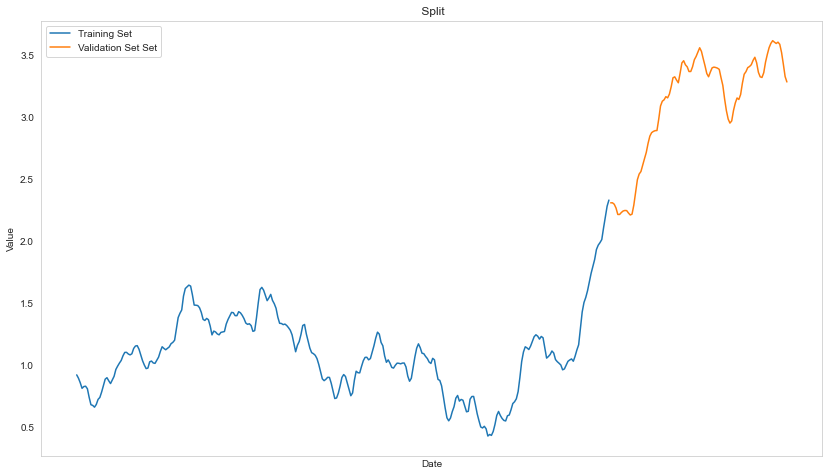

In [6]:
#Train validation split visualization

plt.figure(figsize=(14,8))
plt.plot(train_df['ID0'])
plt.plot(val_df['ID0'])
plt.ylabel("Value")
plt.xlabel("Date")
plt.legend(["Training Set", "Validation Set Set"])
plt.title(" Split")
plt.xticks([])
plt.grid(False)

### Normalize Data
> Normalize data by mean and std

In [7]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std

In [8]:
tsh.dickey_fuller(train_df['ID99'], alpha = 0.01)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

'Fail to reject the null hypothesis, the data is not stationary'

## Reshape Data

In [9]:
sanity_check, train_dict, val_dict, train_shape = tsh.create_time_dict(train_df, val_df, win_len = 50)
sanity_check

,X_train,y_train,X_val,y_val
ID0,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID1,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID2,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID3,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID4,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
...,...,...,...,...
ID95,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID96,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID97,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID98,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"


## LSTM Model

In [12]:
#compile the model and iterate through the data for the initial fit

LSTM_rnn = create_lstm()
tsh.fit_model_dict(LSTM_rnn, train_dict, epochs = 5, batch_size = 50)

Fitting  ID0
Epoch 1/5
5/5 [==============================] - 8s 19ms/step - loss: 0.9103
Epoch 2/5
5/5 [==============================] - 0s 17ms/step - loss: 0.6465
Epoch 3/5
5/5 [==============================] - 0s 18ms/step - loss: 0.5822
Epoch 4/5
5/5 [==============================] - 0s 16ms/step - loss: 0.4696
Epoch 5/5
5/5 [==============================] - 0s 16ms/step - loss: 0.4102
Fitting  ID1
Epoch 1/5
5/5 [==============================] - 0s 17ms/step - loss: 0.1191
Epoch 2/5
5/5 [==============================] - 0s 17ms/step - loss: 0.1221
Epoch 3/5
5/5 [==============================] - 0s 15ms/step - loss: 0.1046
Epoch 4/5
5/5 [==============================] - 0s 18ms/step - loss: 0.1112
Epoch 5/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0863
Fitting  ID2
Epoch 1/5
5/5 [==============================] - 0s 15ms/step - loss: 0.2020
Epoch 2/5
5/5 [==============================] - 0s 15ms/step - loss: 0.1603
Epoch 3/5
5/5 [======================

5/5 [==============================] - 0s 16ms/step - loss: 0.0683
Fitting  ID41
Epoch 1/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0448
Epoch 2/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0512
Epoch 3/5
5/5 [==============================] - 0s 20ms/step - loss: 0.0567
Epoch 4/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0468
Epoch 5/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0519
Fitting  ID42
Epoch 1/5
5/5 [==============================] - 0s 18ms/step - loss: 0.0631
Epoch 2/5
5/5 [==============================] - 0s 18ms/step - loss: 0.0769
Epoch 3/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0626
Epoch 4/5
5/5 [==============================] - 0s 15ms/step - loss: 0.0624
Epoch 5/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0519
Fitting  ID43
Epoch 1/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0417
Epoch 2/5
5/5 [=============================

5/5 [==============================] - 0s 21ms/step - loss: 0.0510
Epoch 5/5
5/5 [==============================] - 0s 18ms/step - loss: 0.0464
Fitting  ID82
Epoch 1/5
5/5 [==============================] - 0s 16ms/step - loss: 0.0317
Epoch 2/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0294
Epoch 3/5
5/5 [==============================] - 0s 26ms/step - loss: 0.0297
Epoch 4/5
5/5 [==============================] - 0s 18ms/step - loss: 0.0378
Epoch 5/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0258
Fitting  ID83
Epoch 1/5
5/5 [==============================] - 0s 15ms/step - loss: 0.0236
Epoch 2/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0286
Epoch 3/5
5/5 [==============================] - 0s 18ms/step - loss: 0.0258
Epoch 4/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0251
Epoch 5/5
5/5 [==============================] - 0s 17ms/step - loss: 0.0262
Fitting  ID84
Epoch 1/5
5/5 [=============================

Min MSE:    0.0006
Max MSE:    0.9944
Median MSE: 0.0063
Mean MSE:   0.0337


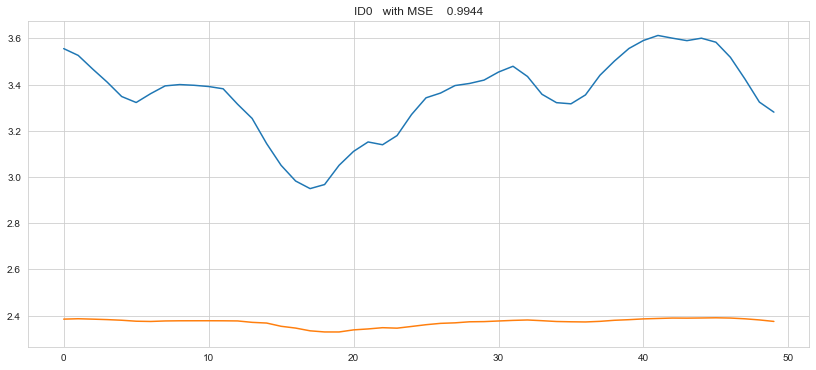

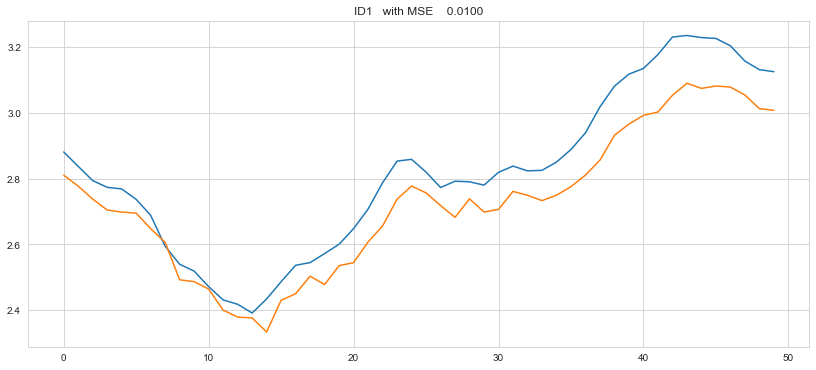

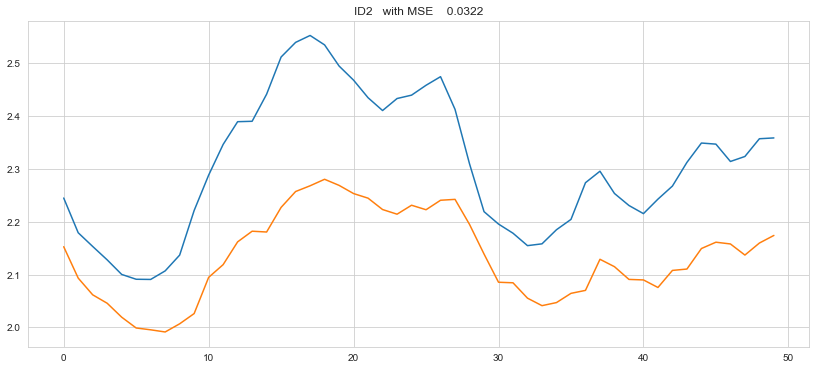

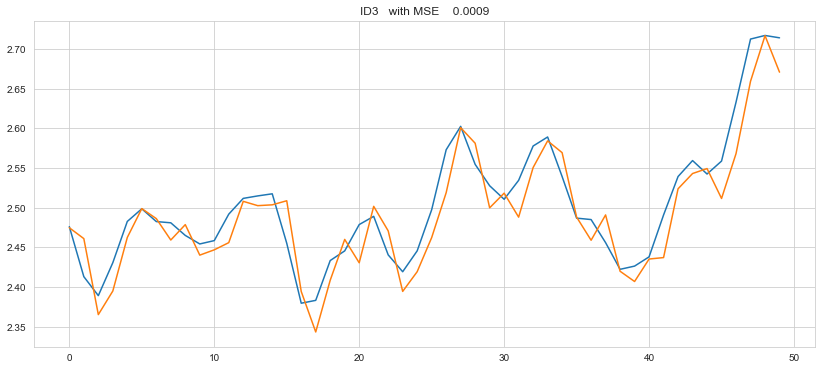

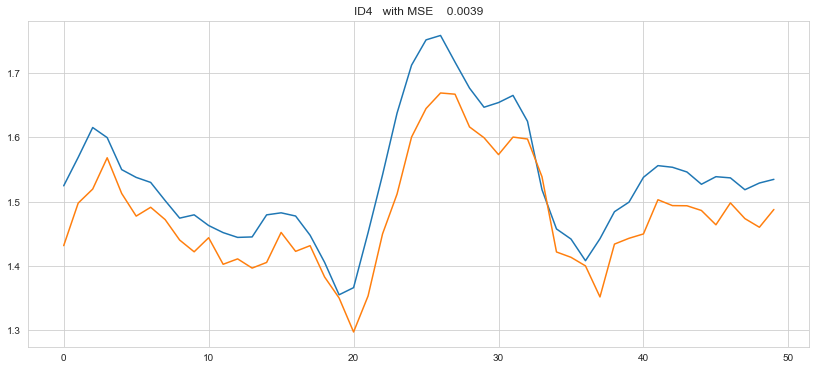

...

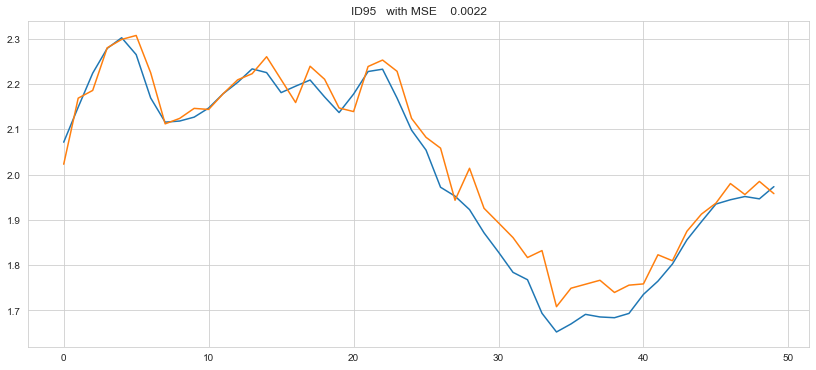

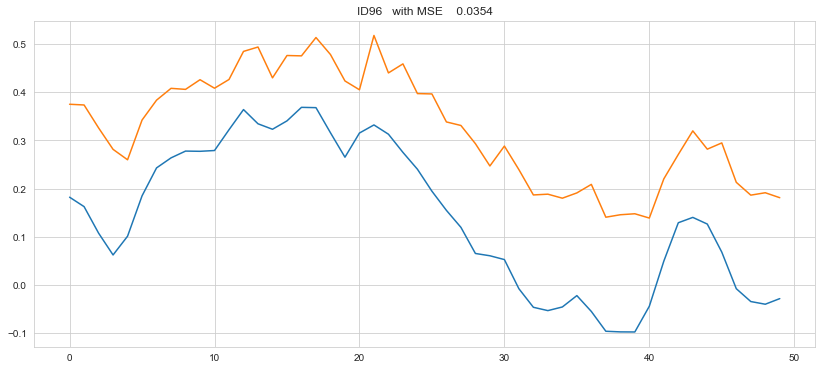

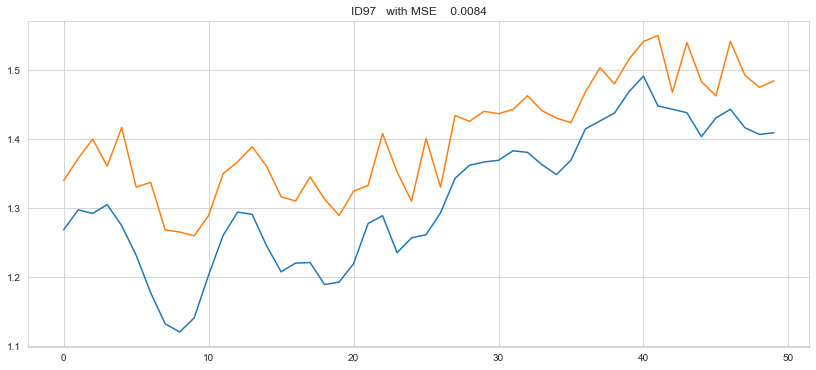

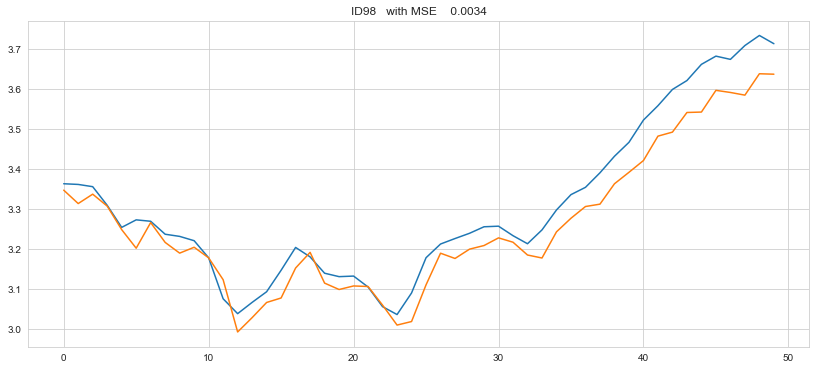

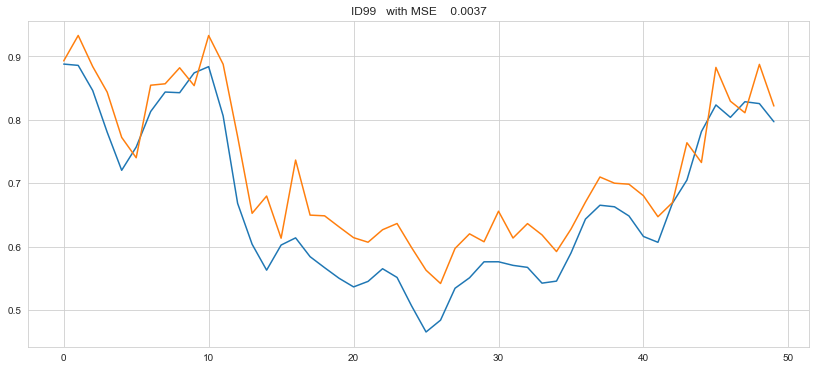

In [13]:
tsh.validate_model_dict(LSTM_rnn, val_dict, train_std, train_mean, plot_results = True )

In [14]:
del LSTM_rnn
tf.keras.backend.clear_session()
gc.collect()

315961

## LSTM Forecast

In [5]:
market1 = pd.read_csv('data/market1_train.csv', index_col=0)

In [6]:
#Normalize

train_df = market1.copy()
full_mean = train_df.mean()
full_std = train_df.std()

train_df = (train_df - full_mean) / full_std
train_df.shape

(400, 100)

In [7]:
sanity_check, train_dict, train_shape = tsh.create_time_dict(train_df,  win_len = 50, create_val = False)
sanity_check

,X_train,y_train
ID0,"(350, 50, 1)","(350,)"
ID1,"(350, 50, 1)","(350,)"
ID2,"(350, 50, 1)","(350,)"
ID3,"(350, 50, 1)","(350,)"
ID4,"(350, 50, 1)","(350,)"
...,...,...
ID95,"(350, 50, 1)","(350,)"
ID96,"(350, 50, 1)","(350,)"
ID97,"(350, 50, 1)","(350,)"
ID98,"(350, 50, 1)","(350,)"


In [8]:
LSTM_rnn = create_lstm()
tsh.fit_model_dict(LSTM_rnn, train_dict, epochs = 5, batch_size = 50)

Fitting  ID0
Epoch 1/5
7/7 [==============================] - 7s 16ms/step - loss: 0.4251
Epoch 2/5
7/7 [==============================] - 0s 15ms/step - loss: 0.1609
Epoch 3/5
7/7 [==============================] - 0s 17ms/step - loss: 0.1562
Epoch 4/5
7/7 [==============================] - 0s 16ms/step - loss: 0.1181
Epoch 5/5
7/7 [==============================] - 0s 15ms/step - loss: 0.1079
Fitting  ID1
Epoch 1/5
7/7 [==============================] - 0s 16ms/step - loss: 0.1726
Epoch 2/5
7/7 [==============================] - 0s 17ms/step - loss: 0.1202
Epoch 3/5
7/7 [==============================] - 0s 16ms/step - loss: 0.1184
Epoch 4/5
7/7 [==============================] - 0s 17ms/step - loss: 0.1275
Epoch 5/5
7/7 [==============================] - 0s 18ms/step - loss: 0.1043
Fitting  ID2
Epoch 1/5
7/7 [==============================] - 0s 17ms/step - loss: 0.1479
Epoch 2/5
7/7 [==============================] - 0s 15ms/step - loss: 0.1226
Epoch 3/5
7/7 [======================

7/7 [==============================] - 1s 81ms/step - loss: 0.0552
Fitting  ID41
Epoch 1/5
7/7 [==============================] - 1s 81ms/step - loss: 0.0427
Epoch 2/5
7/7 [==============================] - 1s 83ms/step - loss: 0.0433
Epoch 3/5
7/7 [==============================] - 1s 82ms/step - loss: 0.0332
Epoch 4/5
7/7 [==============================] - 1s 83ms/step - loss: 0.0352
Epoch 5/5
7/7 [==============================] - 1s 80ms/step - loss: 0.0329
Fitting  ID42
Epoch 1/5
7/7 [==============================] - 1s 81ms/step - loss: 0.0498
Epoch 2/5
7/7 [==============================] - 1s 79ms/step - loss: 0.0502
Epoch 3/5
7/7 [==============================] - 1s 81ms/step - loss: 0.0451
Epoch 4/5
7/7 [==============================] - 1s 84ms/step - loss: 0.0482
Epoch 5/5
7/7 [==============================] - 1s 81ms/step - loss: 0.0465
Fitting  ID43
Epoch 1/5
7/7 [==============================] - 1s 96ms/step - loss: 0.0392
Epoch 2/5
7/7 [=============================

7/7 [==============================] - 1s 90ms/step - loss: 0.0393
Epoch 5/5
7/7 [==============================] - 1s 89ms/step - loss: 0.0395
Fitting  ID82
Epoch 1/5
7/7 [==============================] - 1s 88ms/step - loss: 0.0382
Epoch 2/5
7/7 [==============================] - 1s 88ms/step - loss: 0.0326
Epoch 3/5
7/7 [==============================] - 1s 91ms/step - loss: 0.0409
Epoch 4/5
7/7 [==============================] - 1s 92ms/step - loss: 0.0314
Epoch 5/5
7/7 [==============================] - 1s 93ms/step - loss: 0.0353: 0s - loss: 0.
Fitting  ID83
Epoch 1/5
7/7 [==============================] - 1s 111ms/step - loss: 0.0255
Epoch 2/5
7/7 [==============================] - 1s 92ms/step - loss: 0.0254
Epoch 3/5
7/7 [==============================] - 1s 95ms/step - loss: 0.0216
Epoch 4/5
7/7 [==============================] - 1s 95ms/step - loss: 0.0224
Epoch 5/5
7/7 [==============================] - 1s 94ms/step - loss: 0.0266
Fitting  ID84
Epoch 1/5
7/7 [=============

In [9]:
pred_df = tsh.forecast_dict(LSTM_rnn, train_dict, start_date = '2021-07-10', n_forecast = 20)

Initializing x,y
Predicting ID0  forecast period 1 
Predicting ID0  forecast period 2 
Predicting ID0  forecast period 3 
Predicting ID0  forecast period 4 
Predicting ID0  forecast period 5 
Predicting ID0  forecast period 6 
Predicting ID0  forecast period 7 
Predicting ID0  forecast period 8 
Predicting ID0  forecast period 9 
Predicting ID0  forecast period 10 
Predicting ID0  forecast period 11 
Predicting ID0  forecast period 12 
Predicting ID0  forecast period 13 
Predicting ID0  forecast period 14 
Predicting ID0  forecast period 15 
Predicting ID0  forecast period 16 
Predicting ID0  forecast period 17 
Predicting ID0  forecast period 18 
Predicting ID0  forecast period 19 
Predicting ID0  forecast period 20 
Writing to df
Initializing x,y
Predicting ID1  forecast period 1 
Predicting ID1  forecast period 2 
Predicting ID1  forecast period 3 
Predicting ID1  forecast period 4 
Predicting ID1  forecast period 5 
Predicting ID1  forecast period 6 
Predicting ID1  forecast period

Predicting ID11  forecast period 3 
Predicting ID11  forecast period 4 
Predicting ID11  forecast period 5 
Predicting ID11  forecast period 6 
Predicting ID11  forecast period 7 
Predicting ID11  forecast period 8 
Predicting ID11  forecast period 9 
Predicting ID11  forecast period 10 
Predicting ID11  forecast period 11 
Predicting ID11  forecast period 12 
Predicting ID11  forecast period 13 
Predicting ID11  forecast period 14 
Predicting ID11  forecast period 15 
Predicting ID11  forecast period 16 
Predicting ID11  forecast period 17 
Predicting ID11  forecast period 18 
Predicting ID11  forecast period 19 
Predicting ID11  forecast period 20 
Writing to df
Initializing x,y
Predicting ID12  forecast period 1 
Predicting ID12  forecast period 2 
Predicting ID12  forecast period 3 
Predicting ID12  forecast period 4 
Predicting ID12  forecast period 5 
Predicting ID12  forecast period 6 
Predicting ID12  forecast period 7 
Predicting ID12  forecast period 8 
Predicting ID12  forec

Predicting ID21  forecast period 19 
Predicting ID21  forecast period 20 
Writing to df
Initializing x,y
Predicting ID22  forecast period 1 
Predicting ID22  forecast period 2 
Predicting ID22  forecast period 3 
Predicting ID22  forecast period 4 
Predicting ID22  forecast period 5 
Predicting ID22  forecast period 6 
Predicting ID22  forecast period 7 
Predicting ID22  forecast period 8 
Predicting ID22  forecast period 9 
Predicting ID22  forecast period 10 
Predicting ID22  forecast period 11 
Predicting ID22  forecast period 12 
Predicting ID22  forecast period 13 
Predicting ID22  forecast period 14 
Predicting ID22  forecast period 15 
Predicting ID22  forecast period 16 
Predicting ID22  forecast period 17 
Predicting ID22  forecast period 18 
Predicting ID22  forecast period 19 
Predicting ID22  forecast period 20 
Writing to df
Initializing x,y
Predicting ID23  forecast period 1 
Predicting ID23  forecast period 2 
Predicting ID23  forecast period 3 
Predicting ID23  forecast

Predicting ID32  forecast period 16 
Predicting ID32  forecast period 17 
Predicting ID32  forecast period 18 
Predicting ID32  forecast period 19 
Predicting ID32  forecast period 20 
Writing to df
Initializing x,y
Predicting ID33  forecast period 1 
Predicting ID33  forecast period 2 
Predicting ID33  forecast period 3 
Predicting ID33  forecast period 4 
Predicting ID33  forecast period 5 
Predicting ID33  forecast period 6 
Predicting ID33  forecast period 7 
Predicting ID33  forecast period 8 
Predicting ID33  forecast period 9 
Predicting ID33  forecast period 10 
Predicting ID33  forecast period 11 
Predicting ID33  forecast period 12 
Predicting ID33  forecast period 13 
Predicting ID33  forecast period 14 
Predicting ID33  forecast period 15 
Predicting ID33  forecast period 16 
Predicting ID33  forecast period 17 
Predicting ID33  forecast period 18 
Predicting ID33  forecast period 19 
Predicting ID33  forecast period 20 
Writing to df
Initializing x,y
Predicting ID34  forec

Predicting ID43  forecast period 12 
Predicting ID43  forecast period 13 
Predicting ID43  forecast period 14 
Predicting ID43  forecast period 15 
Predicting ID43  forecast period 16 
Predicting ID43  forecast period 17 
Predicting ID43  forecast period 18 
Predicting ID43  forecast period 19 
Predicting ID43  forecast period 20 
Writing to df
Initializing x,y
Predicting ID44  forecast period 1 
Predicting ID44  forecast period 2 
Predicting ID44  forecast period 3 
Predicting ID44  forecast period 4 
Predicting ID44  forecast period 5 
Predicting ID44  forecast period 6 
Predicting ID44  forecast period 7 
Predicting ID44  forecast period 8 
Predicting ID44  forecast period 9 
Predicting ID44  forecast period 10 
Predicting ID44  forecast period 11 
Predicting ID44  forecast period 12 
Predicting ID44  forecast period 13 
Predicting ID44  forecast period 14 
Predicting ID44  forecast period 15 
Predicting ID44  forecast period 16 
Predicting ID44  forecast period 17 
Predicting ID44 

Predicting ID54  forecast period 9 
Predicting ID54  forecast period 10 
Predicting ID54  forecast period 11 
Predicting ID54  forecast period 12 
Predicting ID54  forecast period 13 
Predicting ID54  forecast period 14 
Predicting ID54  forecast period 15 
Predicting ID54  forecast period 16 
Predicting ID54  forecast period 17 
Predicting ID54  forecast period 18 
Predicting ID54  forecast period 19 
Predicting ID54  forecast period 20 
Writing to df
Initializing x,y
Predicting ID55  forecast period 1 
Predicting ID55  forecast period 2 
Predicting ID55  forecast period 3 
Predicting ID55  forecast period 4 
Predicting ID55  forecast period 5 
Predicting ID55  forecast period 6 
Predicting ID55  forecast period 7 
Predicting ID55  forecast period 8 
Predicting ID55  forecast period 9 
Predicting ID55  forecast period 10 
Predicting ID55  forecast period 11 
Predicting ID55  forecast period 12 
Predicting ID55  forecast period 13 
Predicting ID55  forecast period 14 
Predicting ID55  

Predicting ID65  forecast period 6 
Predicting ID65  forecast period 7 
Predicting ID65  forecast period 8 
Predicting ID65  forecast period 9 
Predicting ID65  forecast period 10 
Predicting ID65  forecast period 11 
Predicting ID65  forecast period 12 
Predicting ID65  forecast period 13 
Predicting ID65  forecast period 14 
Predicting ID65  forecast period 15 
Predicting ID65  forecast period 16 
Predicting ID65  forecast period 17 
Predicting ID65  forecast period 18 
Predicting ID65  forecast period 19 
Predicting ID65  forecast period 20 
Writing to df
Initializing x,y
Predicting ID66  forecast period 1 
Predicting ID66  forecast period 2 
Predicting ID66  forecast period 3 
Predicting ID66  forecast period 4 
Predicting ID66  forecast period 5 
Predicting ID66  forecast period 6 
Predicting ID66  forecast period 7 
Predicting ID66  forecast period 8 
Predicting ID66  forecast period 9 
Predicting ID66  forecast period 10 
Predicting ID66  forecast period 11 
Predicting ID66  for

Predicting ID76  forecast period 2 
Predicting ID76  forecast period 3 
Predicting ID76  forecast period 4 
Predicting ID76  forecast period 5 
Predicting ID76  forecast period 6 
Predicting ID76  forecast period 7 
Predicting ID76  forecast period 8 
Predicting ID76  forecast period 9 
Predicting ID76  forecast period 10 
Predicting ID76  forecast period 11 
Predicting ID76  forecast period 12 
Predicting ID76  forecast period 13 
Predicting ID76  forecast period 14 
Predicting ID76  forecast period 15 
Predicting ID76  forecast period 16 
Predicting ID76  forecast period 17 
Predicting ID76  forecast period 18 
Predicting ID76  forecast period 19 
Predicting ID76  forecast period 20 
Writing to df
Initializing x,y
Predicting ID77  forecast period 1 
Predicting ID77  forecast period 2 
Predicting ID77  forecast period 3 
Predicting ID77  forecast period 4 
Predicting ID77  forecast period 5 
Predicting ID77  forecast period 6 
Predicting ID77  forecast period 7 
Predicting ID77  forec

Predicting ID86  forecast period 19 
Predicting ID86  forecast period 20 
Writing to df
Initializing x,y
Predicting ID87  forecast period 1 
Predicting ID87  forecast period 2 
Predicting ID87  forecast period 3 
Predicting ID87  forecast period 4 
Predicting ID87  forecast period 5 
Predicting ID87  forecast period 6 
Predicting ID87  forecast period 7 
Predicting ID87  forecast period 8 
Predicting ID87  forecast period 9 
Predicting ID87  forecast period 10 
Predicting ID87  forecast period 11 
Predicting ID87  forecast period 12 
Predicting ID87  forecast period 13 
Predicting ID87  forecast period 14 
Predicting ID87  forecast period 15 
Predicting ID87  forecast period 16 
Predicting ID87  forecast period 17 
Predicting ID87  forecast period 18 
Predicting ID87  forecast period 19 
Predicting ID87  forecast period 20 
Writing to df
Initializing x,y
Predicting ID88  forecast period 1 
Predicting ID88  forecast period 2 
Predicting ID88  forecast period 3 
Predicting ID88  forecast

Predicting ID97  forecast period 15 
Predicting ID97  forecast period 16 
Predicting ID97  forecast period 17 
Predicting ID97  forecast period 18 
Predicting ID97  forecast period 19 
Predicting ID97  forecast period 20 
Writing to df
Initializing x,y
Predicting ID98  forecast period 1 
Predicting ID98  forecast period 2 
Predicting ID98  forecast period 3 
Predicting ID98  forecast period 4 
Predicting ID98  forecast period 5 
Predicting ID98  forecast period 6 
Predicting ID98  forecast period 7 
Predicting ID98  forecast period 8 
Predicting ID98  forecast period 9 
Predicting ID98  forecast period 10 
Predicting ID98  forecast period 11 
Predicting ID98  forecast period 12 
Predicting ID98  forecast period 13 
Predicting ID98  forecast period 14 
Predicting ID98  forecast period 15 
Predicting ID98  forecast period 16 
Predicting ID98  forecast period 17 
Predicting ID98  forecast period 18 
Predicting ID98  forecast period 19 
Predicting ID98  forecast period 20 
Writing to df
In

In [10]:
market1_pred = (pred_df * full_std) + full_mean
train_df = (train_df * full_std) + full_mean

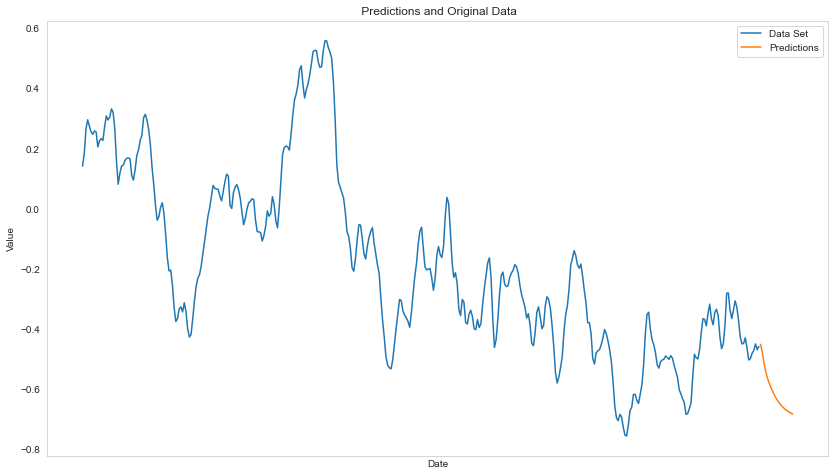

In [11]:
ID = 'ID51'

plt.figure(figsize=(14,8))
plt.plot(train_df[ID])
plt.plot(market1_pred[ID])
plt.ylabel("Value")
plt.xlabel("Date")
plt.legend(["Data Set", "Predictions"])
plt.title(" Predictions and Original Data")
plt.xticks([])
plt.grid(False)

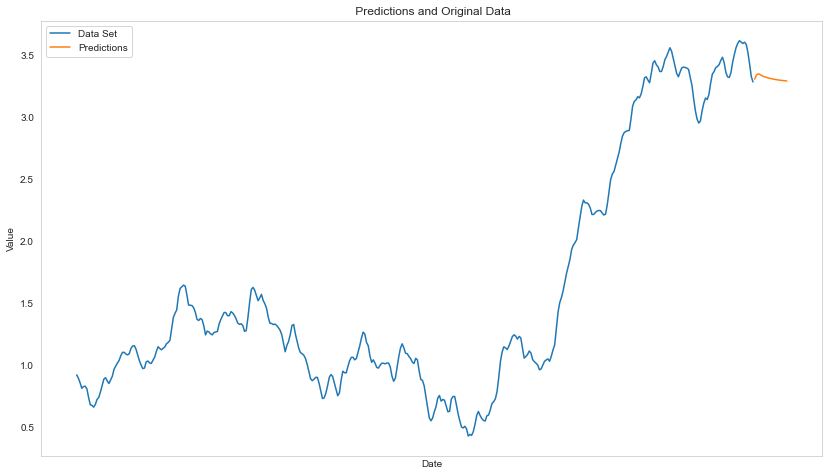

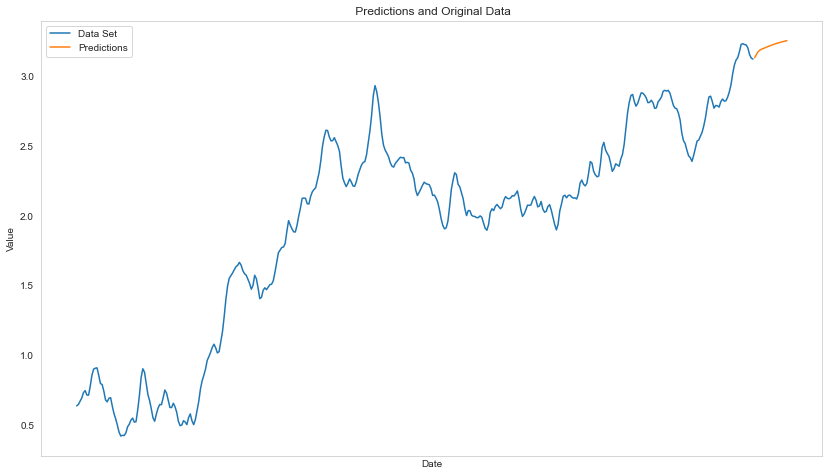

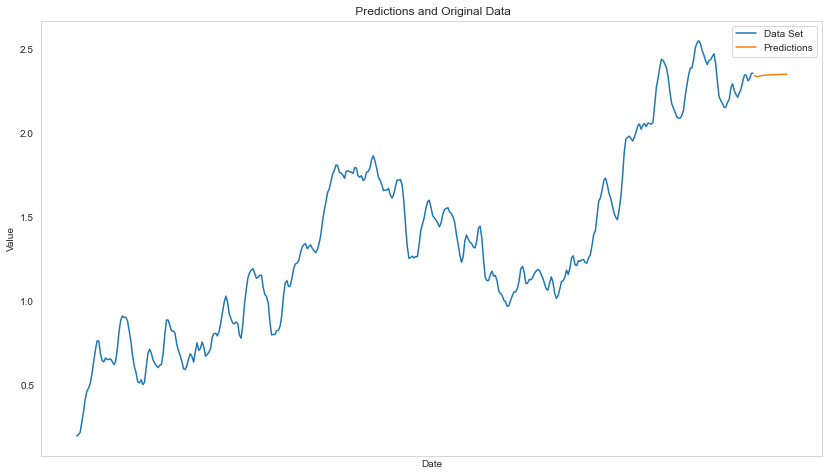

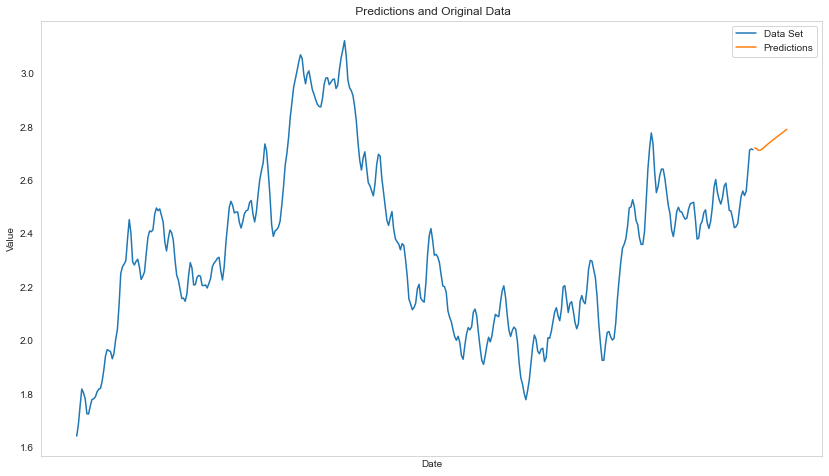

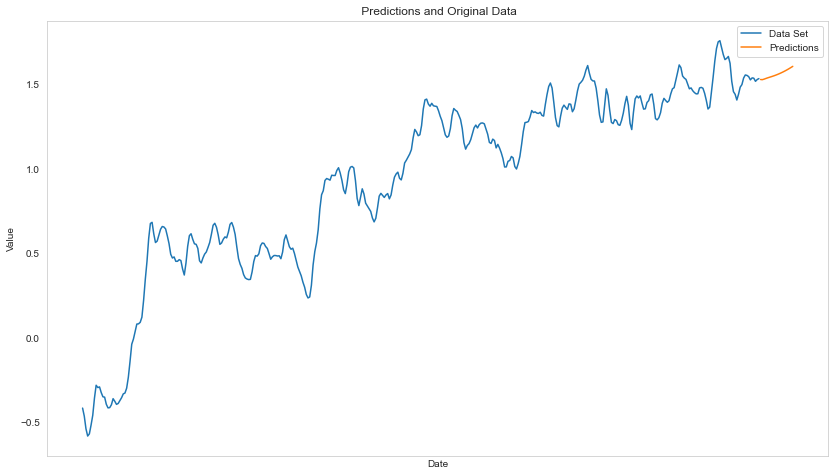

...

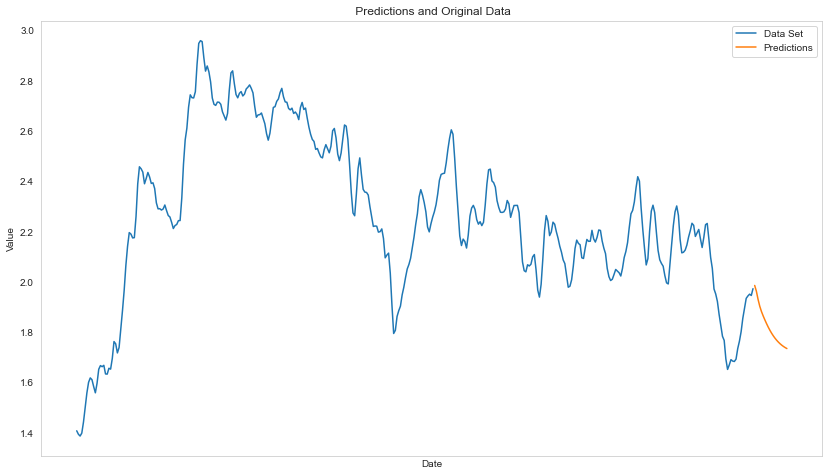

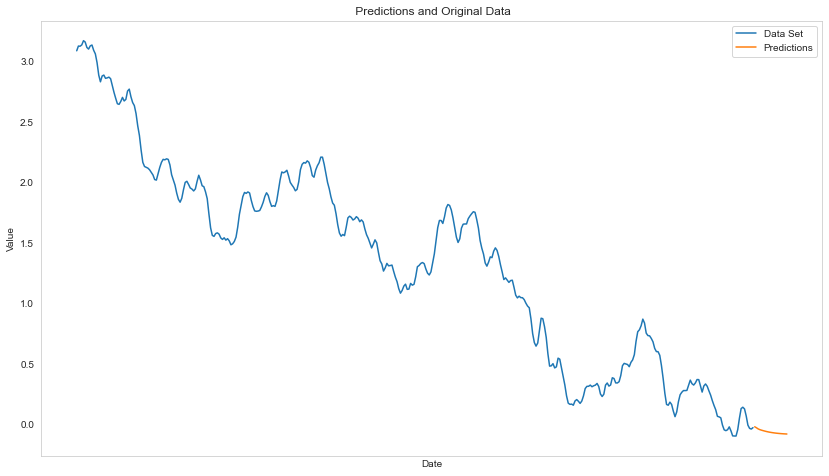

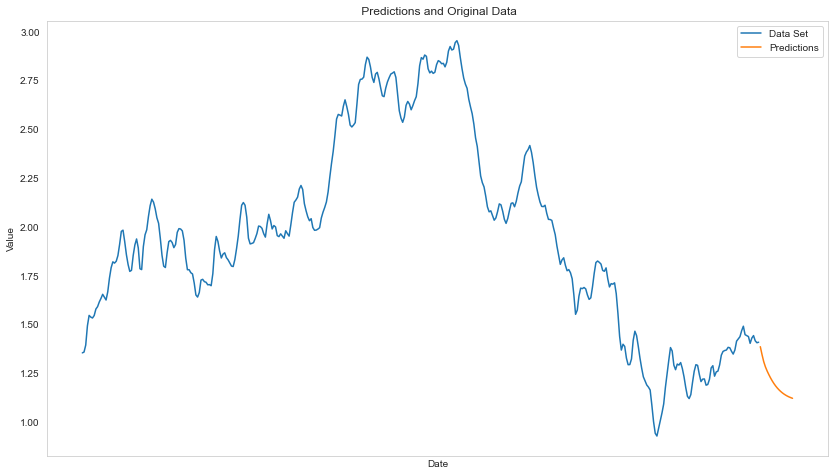

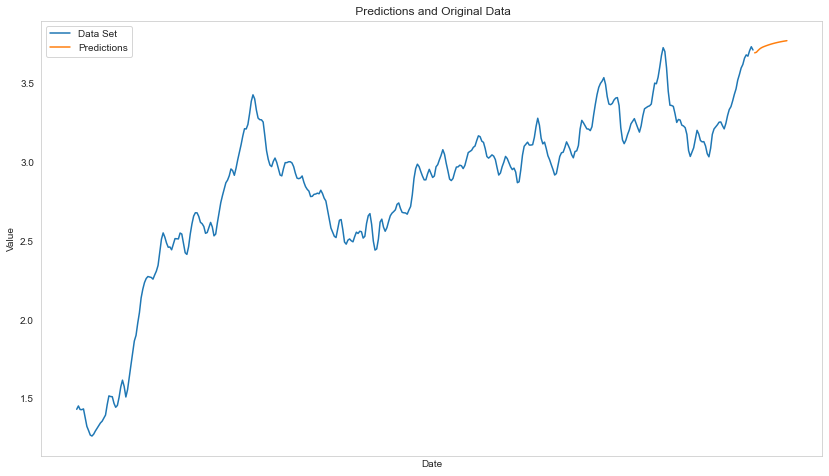

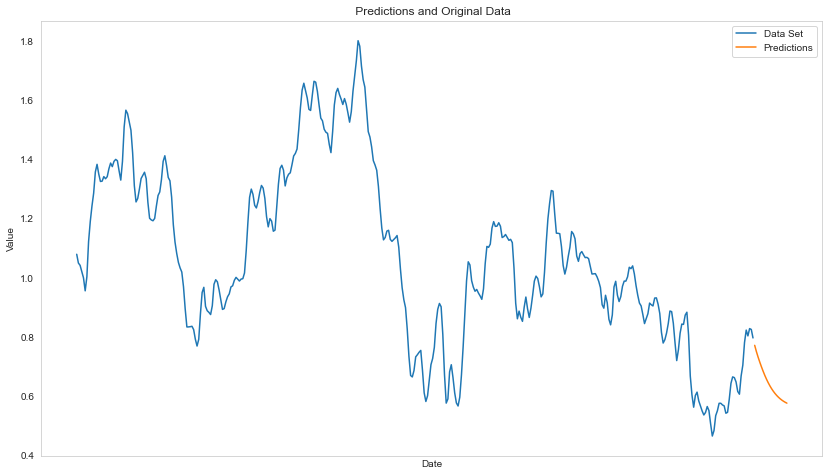

In [14]:
for ent in train_dict:
    plt.figure(figsize=(14,8))
    plt.plot(train_df[ent])
    plt.plot(market1_pred[ent])
    plt.ylabel("Value")
    plt.xlabel("Date")
    plt.legend(["Data Set", "Predictions"])
    plt.title(" Predictions and Original Data")
    plt.xticks([])
    plt.grid(False)

# Market2

In [5]:
market2 = pd.read_csv('data/market2_train.csv', index_col=0)
market2.tail()

,ID100,ID101,ID102,ID103,ID104,ID105,ID106,ID107,ID108,ID109,...,ID190,ID191,ID192,ID193,ID194,ID195,ID196,ID197,ID198,ID199
2021-07-05,-0.615143,3.375599,-3.172252,2.673273,-2.167257,0.075858,-3.327457,1.310824,-1.461301,1.361732,...,0.549661,4.553448,-2.558080,-1.567022,0.484059,0.223102,0.268324,1.636028,-1.412538,-1.794117
2021-07-06,-0.621667,3.373319,-3.151161,2.642860,-2.145078,0.099093,-3.410279,1.365043,-1.530922,1.301718,...,0.522389,4.562694,-2.593431,-1.522245,0.488986,0.203438,0.295143,1.555979,-1.512298,-1.870934
2021-07-07,-0.651792,3.369411,-3.093002,2.572803,-2.089159,0.051647,-3.503021,1.419525,-1.599515,1.314128,...,0.445557,4.489319,-2.629857,-1.576435,0.454626,0.189464,0.262271,1.421856,-1.595485,-1.951770
2021-07-08,-0.651027,3.396121,-3.053060,2.529802,-2.067004,-0.043020,-3.517867,1.518505,-1.623475,1.439887,...,0.366103,4.484172,-2.652675,-1.599746,0.410990,0.220415,0.246241,1.319105,-1.609226,-2.045787
2021-07-09,-0.642755,3.433528,-3.068779,2.542018,-2.024759,-0.087556,-3.512458,1.532683,-1.637972,1.526459,...,0.385293,4.553000,-2.679993,-1.658373,0.385610,0.276029,0.194704,1.322729,-1.623908,-2.133084


## Prepare Data

### Transform Data to Percent Change or Log Returns

market1 = tsh.perc_chng(market1)
market1.head()

### Split Data

In [6]:
train_df = market2.iloc[:300,:].copy()
val_df =  market2.iloc[300:,: ].copy() 
print(train_df.shape, val_df.shape) 

(300, 100) (100, 100)


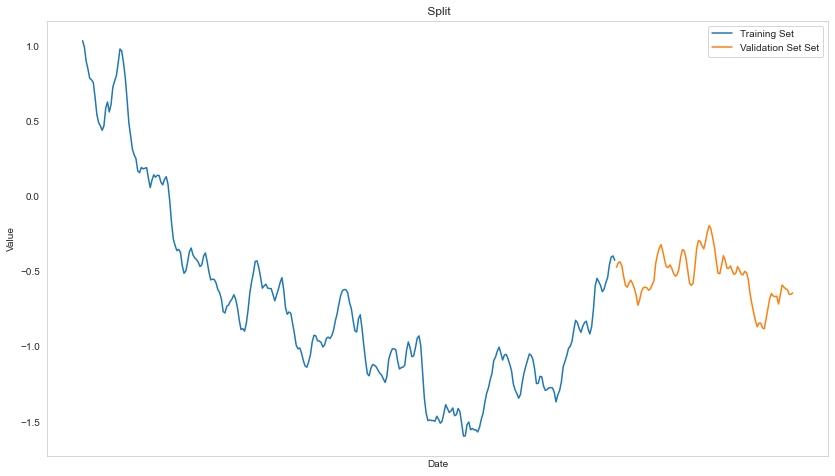

In [7]:
#Train validation split

plt.figure(figsize=(14,8))
plt.plot(train_df['ID100'])
plt.plot(val_df['ID100'])
plt.ylabel("Value")
plt.xlabel("Date")
plt.legend(["Training Set", "Validation Set Set"])
plt.title(" Split")
plt.xticks([])
plt.grid(False)

### Normalize Data

In [8]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std

In [9]:
tsh.dickey_fuller(train_df['ID100'], alpha = 0.01)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

'Fail to reject the null hypothesis, the data is not stationary'

## Reshape Data

In [10]:
sanity_check, train_dict, val_dict, train_shape = tsh.create_time_dict(train_df, val_df, win_len = 50)
sanity_check

,X_train,y_train,X_val,y_val
ID100,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID101,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID102,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID103,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID104,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
...,...,...,...,...
ID195,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID196,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID197,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"
ID198,"(250, 50, 1)","(250,)","(50, 50, 1)","(50,)"


In [11]:
with tf.device('/cpu:0'):
    GRU_mod = create_gru(train_shape)
    tsh.fit_model_dict(GRU_mod, train_dict, epochs = 3, batch_size = 50)

Fitting  ID100
Epoch 1/3
5/5 [==============================] - 5s 57ms/step - loss: 0.3118
Epoch 2/3
5/5 [==============================] - 0s 57ms/step - loss: 0.1453
Epoch 3/3
5/5 [==============================] - 0s 60ms/step - loss: 0.1005
Fitting  ID101
Epoch 1/3
5/5 [==============================] - 0s 61ms/step - loss: 0.4113
Epoch 2/3
5/5 [==============================] - 0s 60ms/step - loss: 0.3875
Epoch 3/3
5/5 [==============================] - 0s 57ms/step - loss: 0.4014
Fitting  ID102
Epoch 1/3
5/5 [==============================] - 0s 59ms/step - loss: 0.1013
Epoch 2/3
5/5 [==============================] - 0s 61ms/step - loss: 0.0770
Epoch 3/3
5/5 [==============================] - 0s 60ms/step - loss: 0.0886
Fitting  ID103
Epoch 1/3
5/5 [==============================] - 0s 67ms/step - loss: 0.2846
Epoch 2/3
5/5 [==============================] - 0s 71ms/step - loss: 0.2590
Epoch 3/3
5/5 [==============================] - 0s 69ms/step - loss: 0.2248
Fitting  ID104
E

5/5 [==============================] - 0s 59ms/step - loss: 0.0392
Epoch 3/3
5/5 [==============================] - 0s 59ms/step - loss: 0.0516
Fitting  ID164
Epoch 1/3
5/5 [==============================] - 0s 61ms/step - loss: 0.0925
Epoch 2/3
5/5 [==============================] - 0s 60ms/step - loss: 0.0750
Epoch 3/3
5/5 [==============================] - 0s 57ms/step - loss: 0.0926
Fitting  ID165
Epoch 1/3
5/5 [==============================] - 0s 60ms/step - loss: 0.0970
Epoch 2/3
5/5 [==============================] - 0s 60ms/step - loss: 0.0951
Epoch 3/3
5/5 [==============================] - 0s 63ms/step - loss: 0.0832
Fitting  ID166
Epoch 1/3
5/5 [==============================] - 0s 62ms/step - loss: 0.0855
Epoch 2/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0810
Epoch 3/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0892
Fitting  ID167
Epoch 1/3
5/5 [==============================] - 0s 62ms/step - loss: 0.0701
Epoch 2/3
5/5 [===========

5/5 [==============================] - 0s 58ms/step - loss: 0.0553
Fitting  ID197
Epoch 1/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0580
Epoch 2/3
5/5 [==============================] - 0s 62ms/step - loss: 0.0606
Epoch 3/3
5/5 [==============================] - 0s 57ms/step - loss: 0.0647
Fitting  ID198
Epoch 1/3
5/5 [==============================] - 0s 65ms/step - loss: 0.0815
Epoch 2/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0945
Epoch 3/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0723
Fitting  ID199
Epoch 1/3
5/5 [==============================] - 0s 61ms/step - loss: 0.0580
Epoch 2/3
5/5 [==============================] - 0s 57ms/step - loss: 0.0516
Epoch 3/3
5/5 [==============================] - 0s 58ms/step - loss: 0.0560


Min MSE:    0.0013
Max MSE:    0.7580
Median MSE: 0.0244
Mean MSE:   0.0954


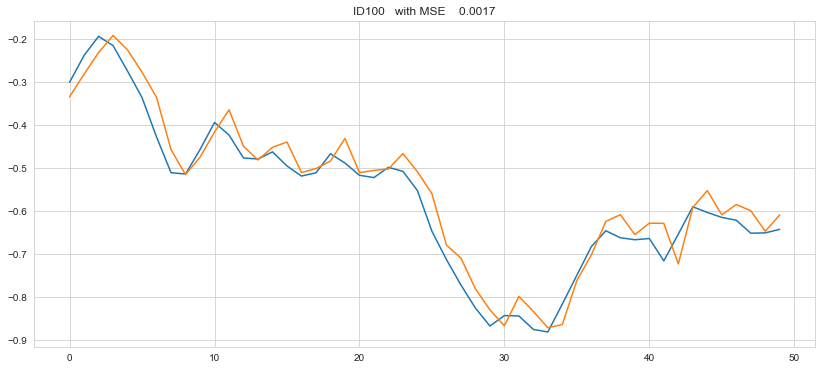

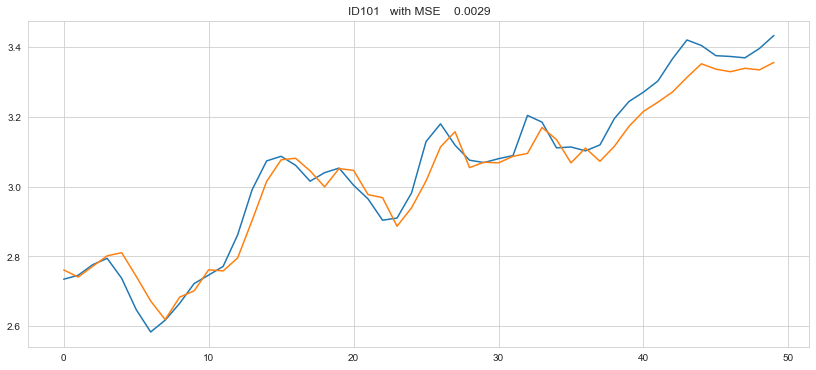

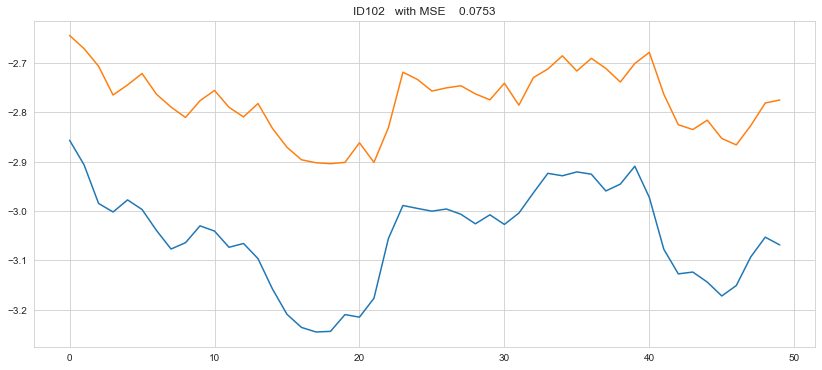

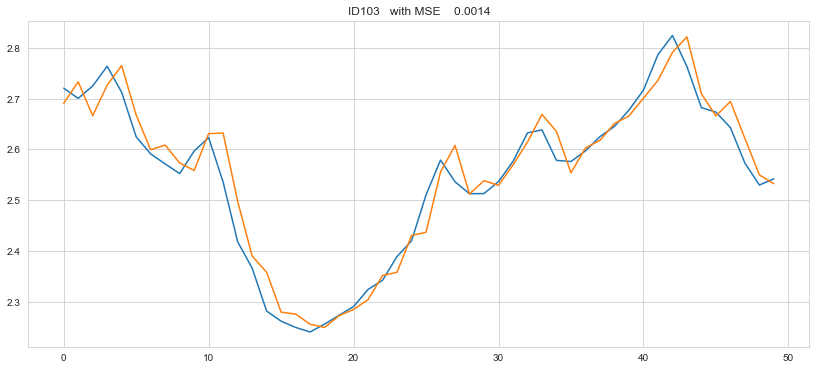

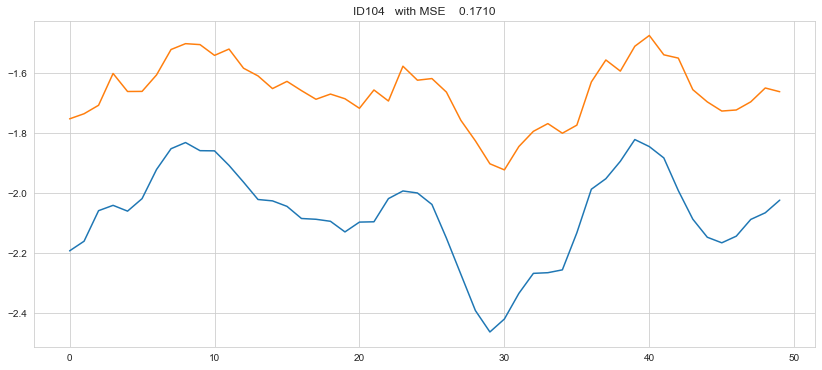

...

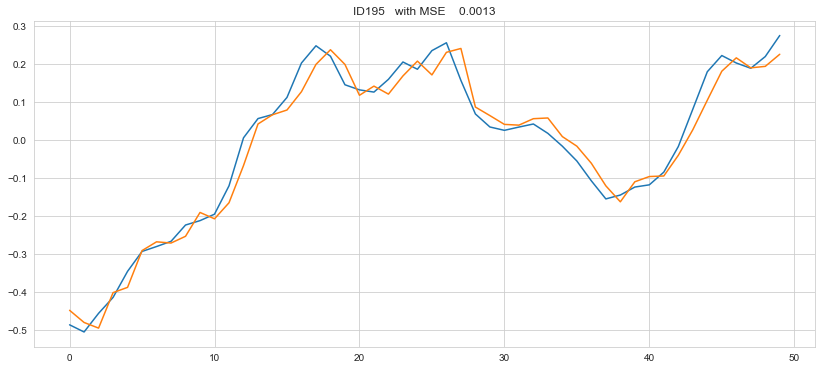

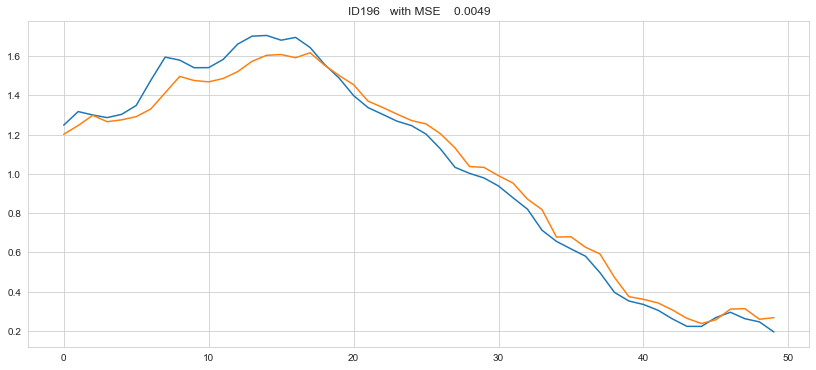

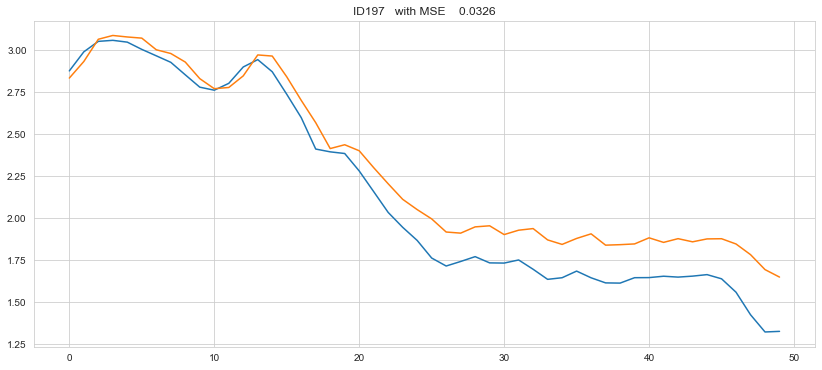

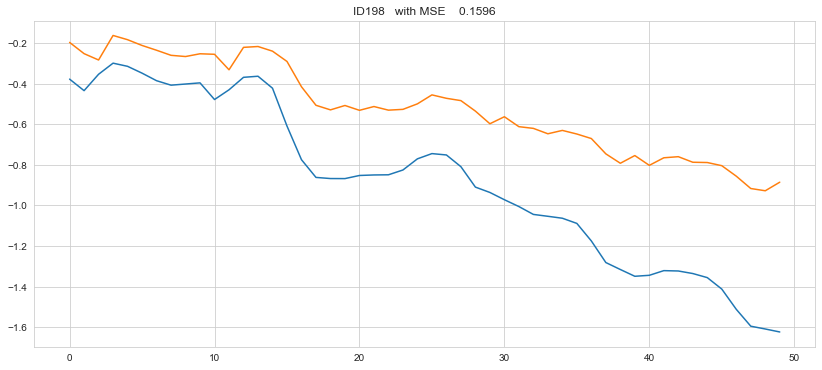

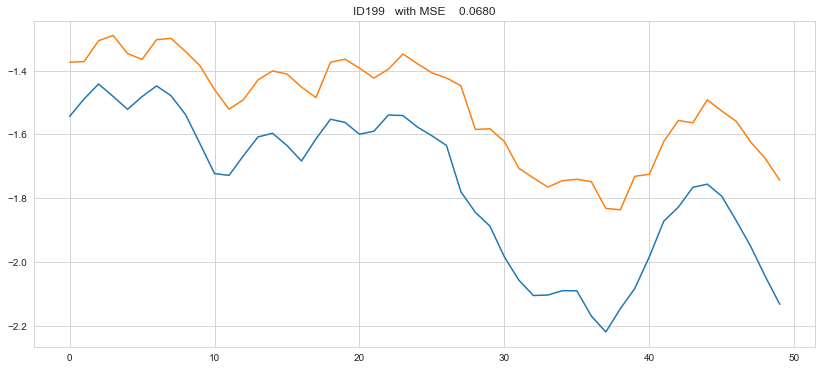

In [12]:
with tf.device('/cpu:0'):
    tsh.validate_model_dict(GRU_mod, val_dict, train_std, train_mean, plot_results = True )

In [13]:
del GRU_mod
tf.keras.backend.clear_session()
gc.collect()

384220

## Predictions

In [5]:
market2 = pd.read_csv('data/market2_train.csv', index_col=0)

In [6]:
#Normalize

train_df = market2.copy()
full_mean = train_df.mean()
full_std = train_df.std()

train_df = (train_df - full_mean) / full_std
train_df.shape

(400, 100)

In [7]:
sanity_check, train_dict, train_shape = tsh.create_time_dict(train_df,  win_len = 50, create_val = False)
sanity_check

,X_train,y_train
ID100,"(350, 50, 1)","(350,)"
ID101,"(350, 50, 1)","(350,)"
ID102,"(350, 50, 1)","(350,)"
ID103,"(350, 50, 1)","(350,)"
ID104,"(350, 50, 1)","(350,)"
...,...,...
ID195,"(350, 50, 1)","(350,)"
ID196,"(350, 50, 1)","(350,)"
ID197,"(350, 50, 1)","(350,)"
ID198,"(350, 50, 1)","(350,)"


In [8]:
with tf.device('/cpu:0'):
    GRU_mod = create_gru(train_shape)
    tsh.fit_model_dict(GRU_mod, train_dict, epochs = 5, batch_size = 50)

Fitting  ID100
Epoch 1/5
7/7 [==============================] - 4s 57ms/step - loss: 0.3493
Epoch 2/5
7/7 [==============================] - 0s 50ms/step - loss: 0.1487
Epoch 3/5
7/7 [==============================] - 0s 47ms/step - loss: 0.1168
Epoch 4/5
7/7 [==============================] - 0s 47ms/step - loss: 0.1112
Epoch 5/5
7/7 [==============================] - 0s 48ms/step - loss: 0.1005
Fitting  ID101
Epoch 1/5
7/7 [==============================] - 0s 47ms/step - loss: 0.3937
Epoch 2/5
7/7 [==============================] - 0s 47ms/step - loss: 0.3713
Epoch 3/5
7/7 [==============================] - 0s 48ms/step - loss: 0.3393
Epoch 4/5
7/7 [==============================] - 0s 47ms/step - loss: 0.2492
Epoch 5/5
7/7 [==============================] - 0s 48ms/step - loss: 0.2884
Fitting  ID102
Epoch 1/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0804
Epoch 2/5
7/7 [==============================] - 0s 50ms/step - loss: 0.0681
Epoch 3/5
7/7 [================

7/7 [==============================] - 0s 54ms/step - loss: 0.0811
Epoch 3/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0732
Epoch 4/5
7/7 [==============================] - 0s 53ms/step - loss: 0.0656
Epoch 5/5
7/7 [==============================] - 0s 52ms/step - loss: 0.0668
Fitting  ID140
Epoch 1/5
7/7 [==============================] - 0s 52ms/step - loss: 0.0309
Epoch 2/5
7/7 [==============================] - 0s 53ms/step - loss: 0.0302
Epoch 3/5
7/7 [==============================] - 0s 50ms/step - loss: 0.0476
Epoch 4/5
7/7 [==============================] - 0s 50ms/step - loss: 0.0447
Epoch 5/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0375
Fitting  ID141
Epoch 1/5
7/7 [==============================] - 0s 53ms/step - loss: 0.0359
Epoch 2/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0396
Epoch 3/5
7/7 [==============================] - 0s 52ms/step - loss: 0.0373
Epoch 4/5
7/7 [==============================] - 0s 59ms

7/7 [==============================] - 0s 51ms/step - loss: 0.0330
Epoch 2/5
7/7 [==============================] - 0s 55ms/step - loss: 0.0355
Epoch 3/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0510
Epoch 4/5
7/7 [==============================] - 0s 53ms/step - loss: 0.0403
Epoch 5/5
7/7 [==============================] - 0s 52ms/step - loss: 0.0402
Fitting  ID181
Epoch 1/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0658
Epoch 2/5
7/7 [==============================] - 0s 53ms/step - loss: 0.0572
Epoch 3/5
7/7 [==============================] - 0s 52ms/step - loss: 0.0611
Epoch 4/5
7/7 [==============================] - 0s 56ms/step - loss: 0.0579
Epoch 5/5
7/7 [==============================] - 0s 50ms/step - loss: 0.0552
Fitting  ID182
Epoch 1/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0596
Epoch 2/5
7/7 [==============================] - 0s 51ms/step - loss: 0.0573
Epoch 3/5
7/7 [==============================] - 0s 50ms

In [9]:
with tf.device('/cpu:0'):
    pred_df = tsh.forecast_dict(GRU_mod, train_dict, start_date = '2021-07-10', n_forecast = 20)

Initializing x,y
Predicting ID100  forecast period 1 
Predicting ID100  forecast period 2 
Predicting ID100  forecast period 3 
Predicting ID100  forecast period 4 
Predicting ID100  forecast period 5 
Predicting ID100  forecast period 6 
Predicting ID100  forecast period 7 
Predicting ID100  forecast period 8 
Predicting ID100  forecast period 9 
Predicting ID100  forecast period 10 
Predicting ID100  forecast period 11 
Predicting ID100  forecast period 12 
Predicting ID100  forecast period 13 
Predicting ID100  forecast period 14 
Predicting ID100  forecast period 15 
Predicting ID100  forecast period 16 
Predicting ID100  forecast period 17 
Predicting ID100  forecast period 18 
Predicting ID100  forecast period 19 
Predicting ID100  forecast period 20 
Writing to df
Initializing x,y
Predicting ID101  forecast period 1 
Predicting ID101  forecast period 2 
Predicting ID101  forecast period 3 
Predicting ID101  forecast period 4 
Predicting ID101  forecast period 5 
Predicting ID101

Predicting ID110  forecast period 12 
Predicting ID110  forecast period 13 
Predicting ID110  forecast period 14 
Predicting ID110  forecast period 15 
Predicting ID110  forecast period 16 
Predicting ID110  forecast period 17 
Predicting ID110  forecast period 18 
Predicting ID110  forecast period 19 
Predicting ID110  forecast period 20 
Writing to df
Initializing x,y
Predicting ID111  forecast period 1 
Predicting ID111  forecast period 2 
Predicting ID111  forecast period 3 
Predicting ID111  forecast period 4 
Predicting ID111  forecast period 5 
Predicting ID111  forecast period 6 
Predicting ID111  forecast period 7 
Predicting ID111  forecast period 8 
Predicting ID111  forecast period 9 
Predicting ID111  forecast period 10 
Predicting ID111  forecast period 11 
Predicting ID111  forecast period 12 
Predicting ID111  forecast period 13 
Predicting ID111  forecast period 14 
Predicting ID111  forecast period 15 
Predicting ID111  forecast period 16 
Predicting ID111  forecast p

Predicting ID121  forecast period 5 
Predicting ID121  forecast period 6 
Predicting ID121  forecast period 7 
Predicting ID121  forecast period 8 
Predicting ID121  forecast period 9 
Predicting ID121  forecast period 10 
Predicting ID121  forecast period 11 
Predicting ID121  forecast period 12 
Predicting ID121  forecast period 13 
Predicting ID121  forecast period 14 
Predicting ID121  forecast period 15 
Predicting ID121  forecast period 16 
Predicting ID121  forecast period 17 
Predicting ID121  forecast period 18 
Predicting ID121  forecast period 19 
Predicting ID121  forecast period 20 
Writing to df
Initializing x,y
Predicting ID122  forecast period 1 
Predicting ID122  forecast period 2 
Predicting ID122  forecast period 3 
Predicting ID122  forecast period 4 
Predicting ID122  forecast period 5 
Predicting ID122  forecast period 6 
Predicting ID122  forecast period 7 
Predicting ID122  forecast period 8 
Predicting ID122  forecast period 9 
Predicting ID122  forecast period

Predicting ID131  forecast period 18 
Predicting ID131  forecast period 19 
Predicting ID131  forecast period 20 
Writing to df
Initializing x,y
Predicting ID132  forecast period 1 
Predicting ID132  forecast period 2 
Predicting ID132  forecast period 3 
Predicting ID132  forecast period 4 
Predicting ID132  forecast period 5 
Predicting ID132  forecast period 6 
Predicting ID132  forecast period 7 
Predicting ID132  forecast period 8 
Predicting ID132  forecast period 9 
Predicting ID132  forecast period 10 
Predicting ID132  forecast period 11 
Predicting ID132  forecast period 12 
Predicting ID132  forecast period 13 
Predicting ID132  forecast period 14 
Predicting ID132  forecast period 15 
Predicting ID132  forecast period 16 
Predicting ID132  forecast period 17 
Predicting ID132  forecast period 18 
Predicting ID132  forecast period 19 
Predicting ID132  forecast period 20 
Writing to df
Initializing x,y
Predicting ID133  forecast period 1 
Predicting ID133  forecast period 2 

Predicting ID142  forecast period 11 
Predicting ID142  forecast period 12 
Predicting ID142  forecast period 13 
Predicting ID142  forecast period 14 
Predicting ID142  forecast period 15 
Predicting ID142  forecast period 16 
Predicting ID142  forecast period 17 
Predicting ID142  forecast period 18 
Predicting ID142  forecast period 19 
Predicting ID142  forecast period 20 
Writing to df
Initializing x,y
Predicting ID143  forecast period 1 
Predicting ID143  forecast period 2 
Predicting ID143  forecast period 3 
Predicting ID143  forecast period 4 
Predicting ID143  forecast period 5 
Predicting ID143  forecast period 6 
Predicting ID143  forecast period 7 
Predicting ID143  forecast period 8 
Predicting ID143  forecast period 9 
Predicting ID143  forecast period 10 
Predicting ID143  forecast period 11 
Predicting ID143  forecast period 12 
Predicting ID143  forecast period 13 
Predicting ID143  forecast period 14 
Predicting ID143  forecast period 15 
Predicting ID143  forecast p

Predicting ID153  forecast period 5 
Predicting ID153  forecast period 6 
Predicting ID153  forecast period 7 
Predicting ID153  forecast period 8 
Predicting ID153  forecast period 9 
Predicting ID153  forecast period 10 
Predicting ID153  forecast period 11 
Predicting ID153  forecast period 12 
Predicting ID153  forecast period 13 
Predicting ID153  forecast period 14 
Predicting ID153  forecast period 15 
Predicting ID153  forecast period 16 
Predicting ID153  forecast period 17 
Predicting ID153  forecast period 18 
Predicting ID153  forecast period 19 
Predicting ID153  forecast period 20 
Writing to df
Initializing x,y
Predicting ID154  forecast period 1 
Predicting ID154  forecast period 2 
Predicting ID154  forecast period 3 
Predicting ID154  forecast period 4 
Predicting ID154  forecast period 5 
Predicting ID154  forecast period 6 
Predicting ID154  forecast period 7 
Predicting ID154  forecast period 8 
Predicting ID154  forecast period 9 
Predicting ID154  forecast period

Predicting ID163  forecast period 19 
Predicting ID163  forecast period 20 
Writing to df
Initializing x,y
Predicting ID164  forecast period 1 
Predicting ID164  forecast period 2 
Predicting ID164  forecast period 3 
Predicting ID164  forecast period 4 
Predicting ID164  forecast period 5 
Predicting ID164  forecast period 6 
Predicting ID164  forecast period 7 
Predicting ID164  forecast period 8 
Predicting ID164  forecast period 9 
Predicting ID164  forecast period 10 
Predicting ID164  forecast period 11 
Predicting ID164  forecast period 12 
Predicting ID164  forecast period 13 
Predicting ID164  forecast period 14 
Predicting ID164  forecast period 15 
Predicting ID164  forecast period 16 
Predicting ID164  forecast period 17 
Predicting ID164  forecast period 18 
Predicting ID164  forecast period 19 
Predicting ID164  forecast period 20 
Writing to df
Initializing x,y
Predicting ID165  forecast period 1 
Predicting ID165  forecast period 2 
Predicting ID165  forecast period 3 


Predicting ID174  forecast period 11 
Predicting ID174  forecast period 12 
Predicting ID174  forecast period 13 
Predicting ID174  forecast period 14 
Predicting ID174  forecast period 15 
Predicting ID174  forecast period 16 
Predicting ID174  forecast period 17 
Predicting ID174  forecast period 18 
Predicting ID174  forecast period 19 
Predicting ID174  forecast period 20 
Writing to df
Initializing x,y
Predicting ID175  forecast period 1 
Predicting ID175  forecast period 2 
Predicting ID175  forecast period 3 
Predicting ID175  forecast period 4 
Predicting ID175  forecast period 5 
Predicting ID175  forecast period 6 
Predicting ID175  forecast period 7 
Predicting ID175  forecast period 8 
Predicting ID175  forecast period 9 
Predicting ID175  forecast period 10 
Predicting ID175  forecast period 11 
Predicting ID175  forecast period 12 
Predicting ID175  forecast period 13 
Predicting ID175  forecast period 14 
Predicting ID175  forecast period 15 
Predicting ID175  forecast p

Predicting ID185  forecast period 3 
Predicting ID185  forecast period 4 
Predicting ID185  forecast period 5 
Predicting ID185  forecast period 6 
Predicting ID185  forecast period 7 
Predicting ID185  forecast period 8 
Predicting ID185  forecast period 9 
Predicting ID185  forecast period 10 
Predicting ID185  forecast period 11 
Predicting ID185  forecast period 12 
Predicting ID185  forecast period 13 
Predicting ID185  forecast period 14 
Predicting ID185  forecast period 15 
Predicting ID185  forecast period 16 
Predicting ID185  forecast period 17 
Predicting ID185  forecast period 18 
Predicting ID185  forecast period 19 
Predicting ID185  forecast period 20 
Writing to df
Initializing x,y
Predicting ID186  forecast period 1 
Predicting ID186  forecast period 2 
Predicting ID186  forecast period 3 
Predicting ID186  forecast period 4 
Predicting ID186  forecast period 5 
Predicting ID186  forecast period 6 
Predicting ID186  forecast period 7 
Predicting ID186  forecast period

Predicting ID195  forecast period 14 
Predicting ID195  forecast period 15 
Predicting ID195  forecast period 16 
Predicting ID195  forecast period 17 
Predicting ID195  forecast period 18 
Predicting ID195  forecast period 19 
Predicting ID195  forecast period 20 
Writing to df
Initializing x,y
Predicting ID196  forecast period 1 
Predicting ID196  forecast period 2 
Predicting ID196  forecast period 3 
Predicting ID196  forecast period 4 
Predicting ID196  forecast period 5 
Predicting ID196  forecast period 6 
Predicting ID196  forecast period 7 
Predicting ID196  forecast period 8 
Predicting ID196  forecast period 9 
Predicting ID196  forecast period 10 
Predicting ID196  forecast period 11 
Predicting ID196  forecast period 12 
Predicting ID196  forecast period 13 
Predicting ID196  forecast period 14 
Predicting ID196  forecast period 15 
Predicting ID196  forecast period 16 
Predicting ID196  forecast period 17 
Predicting ID196  forecast period 18 
Predicting ID196  forecast p

In [10]:
market2_pred = (pred_df * full_std) + full_mean
train_df = (train_df * full_std) + full_mean

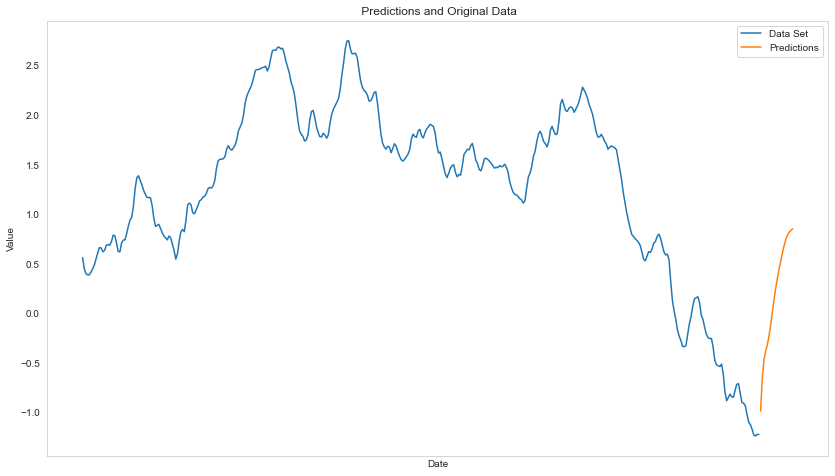

In [12]:
ID = 'ID151'

plt.figure(figsize=(14,8))
plt.plot(train_df[ID])
plt.plot(market2_pred[ID])
plt.ylabel("Value")
plt.xlabel("Date")
plt.legend(["Data Set", "Predictions"])
plt.title(" Predictions and Original Data")
plt.xticks([])
plt.grid(False)

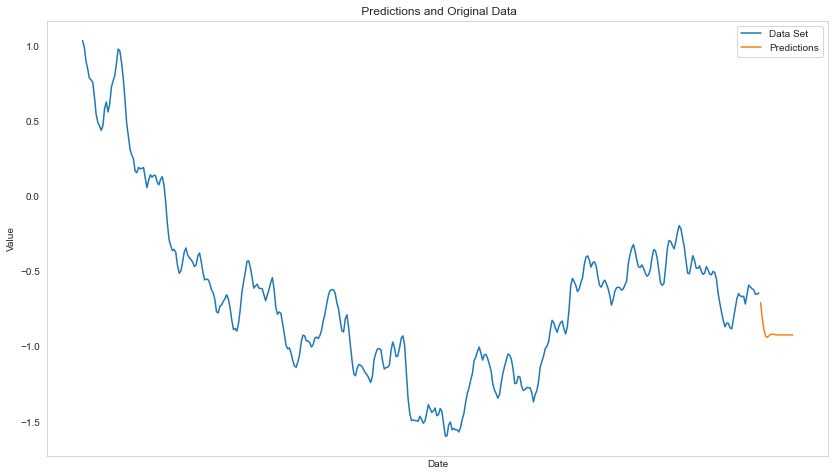

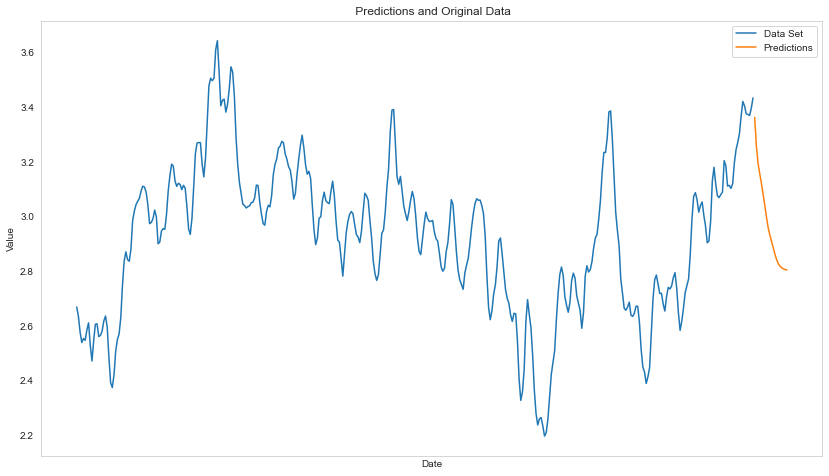

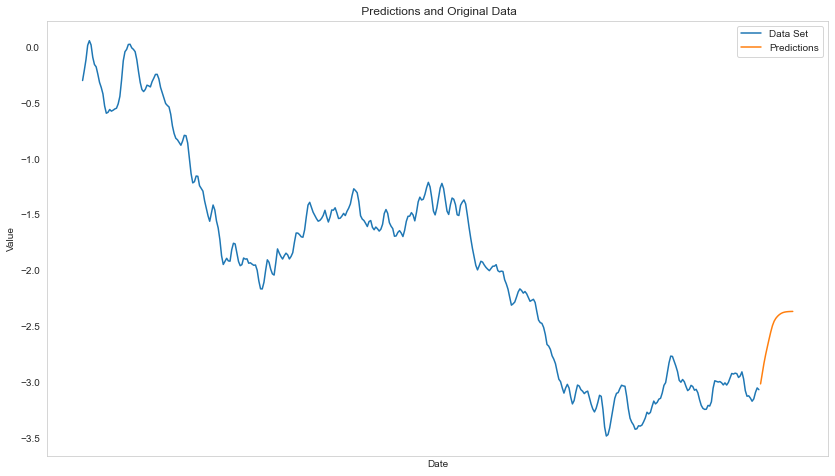

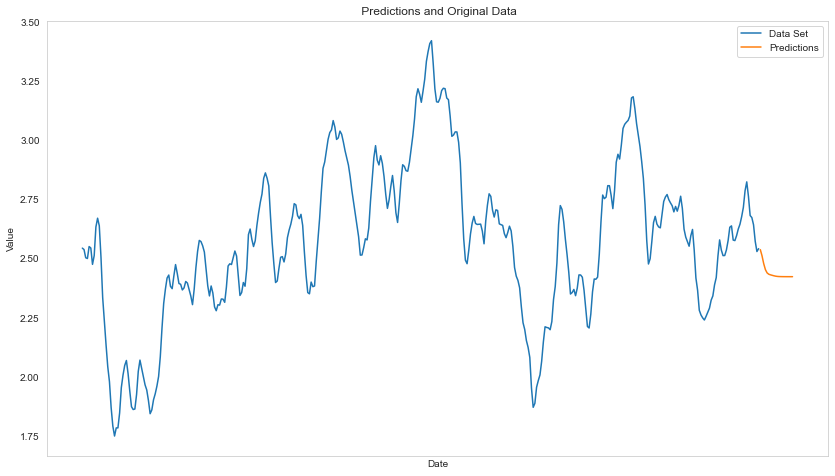

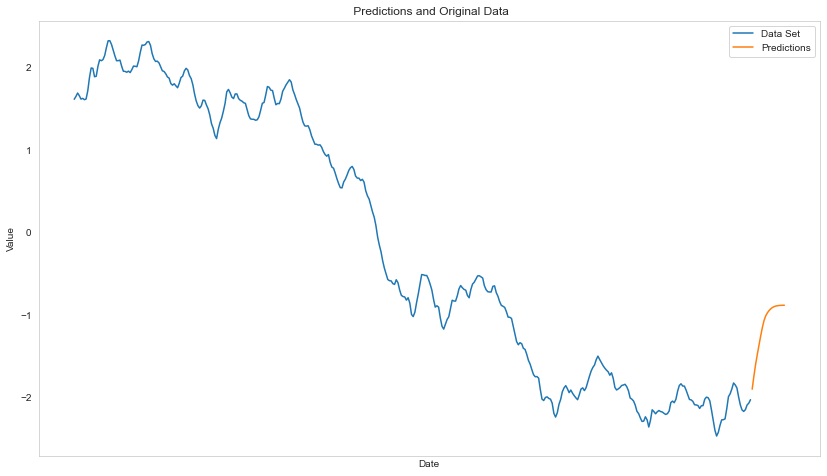

...

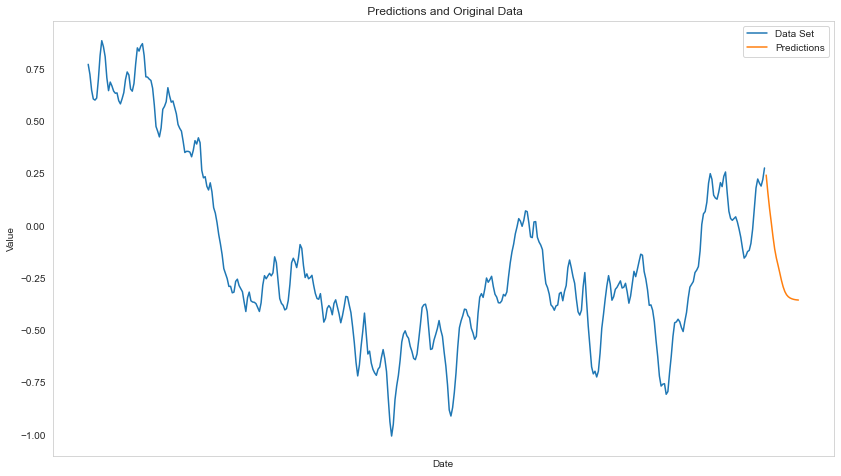

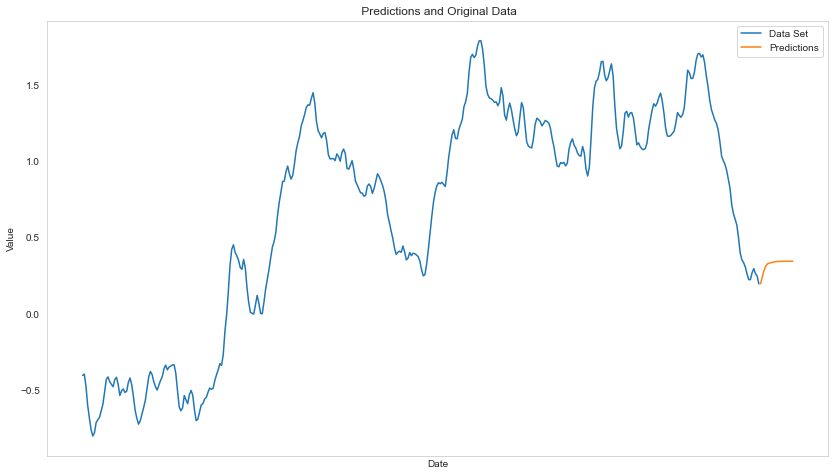

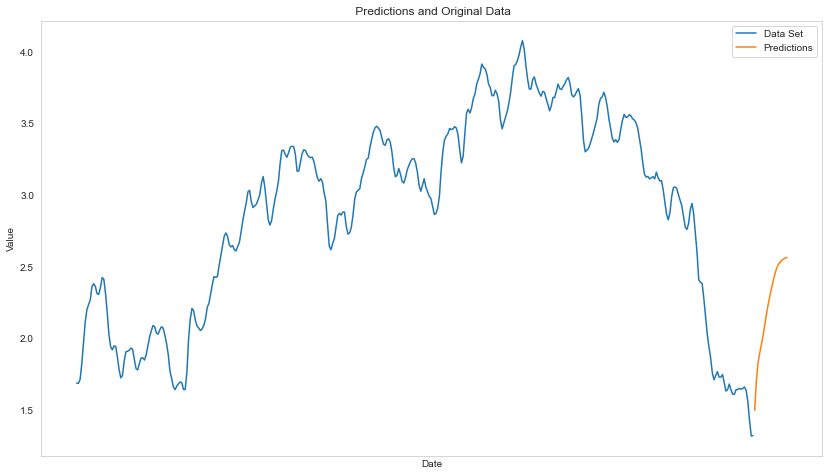

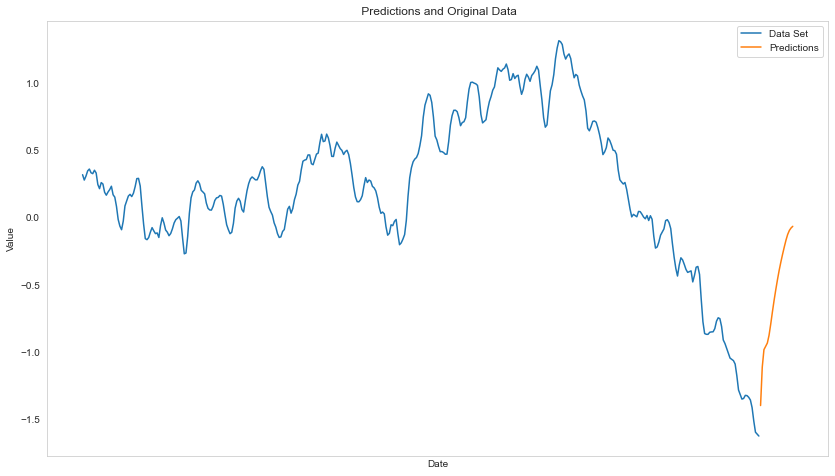

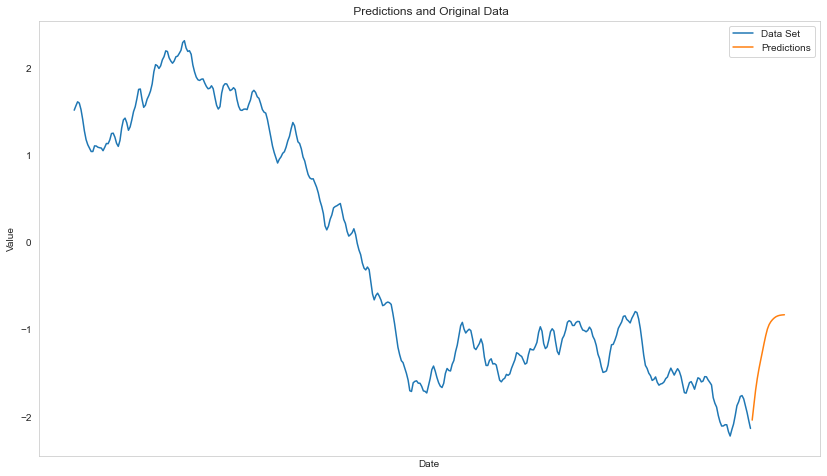

In [14]:
for ent in train_dict:
    plt.figure(figsize=(14,8))
    plt.plot(train_df[ent])
    plt.plot(market2_pred[ent])
    plt.ylabel("Value")
    plt.xlabel("Date")
    plt.legend(["Data Set", "Predictions"])
    plt.title(" Predictions and Original Data")
    plt.xticks([])
    plt.grid(False)